# (Machine) Learning to Social Distancing

## Introduction
In this notebook there is an implementation of Social Distance analysis, using a DeepLearning people detector called OpenPose.

You will see an intuition behind the estimation of people's distance in an image, using ML (DL in particular) and Computer Vision techniques.

Rembember to set the Runtime to GPU ("Runtime" > "Change Runtime Type")

First of all, clear a possible existing installation environment.

In [ ]:
# Clear
!rm -rf openpose

All the neural networks may run using the CPU, but in this way they tends to be slow. A trick for this is running on GPU. If the correct runtime has been set, this command should show the ammount of vRAM given to your instance.


In [ ]:
!nvidia-smi

Thu Feb  4 19:11:56 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.39       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   58C    P8    10W /  70W |      0MiB / 15079MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# Downloading and installing OpenPose

In this section we will see the procedure to install this particular neural network for people detection. We will be using the latest version (as of Jan 2021 it's the 1.7.0). 



## Building from source

This step requires a lot of time (5-10 minutes at least), so make yourself a coffe or a tea while waiting for the compiler.

In [ ]:
import os
from os.path import exists, join, basename, splitext

git_repo_url = 'https://github.com/CMU-Perceptual-Computing-Lab/openpose.git'
project_name = splitext(basename(git_repo_url))[0]

if not exists(project_name):
  # see: https://github.com/CMU-Perceptual-Computing-Lab/openpose/issues/949
  # install new CMake because of CUDA10
  !wget -q -O cmake-3.13.0-Linux-x86_64.tar.gz https://cmake.org/files/v3.13/cmake-3.13.0-Linux-x86_64.tar.gz
  !tar xfz cmake-3.13.0-Linux-x86_64.tar.gz --strip-components=1 -C /usr/local
  # clone openpose
  !git clone -q --depth 1 $git_repo_url
  # !git clone $git_repo_url
  
  # install system dependencies
  !apt-get -qq install -y libatlas-base-dev libprotobuf-dev libleveldb-dev libsnappy-dev libhdf5-serial-dev protobuf-compiler libgflags-dev libgoogle-glog-dev liblmdb-dev opencl-headers ocl-icd-opencl-dev libviennacl-dev
  
  # openpose version 1.6
  # !cd openpose && git checkout 3d057691b219dddf264c6e412a4560ac8a12dedb
  
  # fix to the caffe lib
  !sed -i 's/execute_process(COMMAND git checkout master WORKING_DIRECTORY ${CMAKE_SOURCE_DIR}\/3rdparty\/caffe)/execute_process(COMMAND git checkout f019d0dfe86f49d1140961f8c7dec22130c83154 WORKING_DIRECTORY ${CMAKE_SOURCE_DIR}\/3rdparty\/caffe)/g' openpose/CMakeLists.txt
  
  # build openpose
  !cd openpose && rm -rf build || true && mkdir build && cd build && cmake -DBUILD_PYTHON=ON .. && make -j`nproc` && sudo make install
else:
  !cd openpose && cd build && sudo make install

print('Done.')

Selecting previously unselected package libgflags2.2.
(Reading database ... 146456 files and directories currently installed.)
Preparing to unpack .../00-libgflags2.2_2.2.1-1_amd64.deb ...
Unpacking libgflags2.2 (2.2.1-1) ...
Selecting previously unselected package libgflags-dev.
Preparing to unpack .../01-libgflags-dev_2.2.1-1_amd64.deb ...
Unpacking libgflags-dev (2.2.1-1) ...
Selecting previously unselected package libgoogle-glog0v5.
Preparing to unpack .../02-libgoogle-glog0v5_0.3.5-1_amd64.deb ...
Unpacking libgoogle-glog0v5 (0.3.5-1) ...
Selecting previously unselected package libgoogle-glog-dev.
Preparing to unpack .../03-libgoogle-glog-dev_0.3.5-1_amd64.deb ...
Unpacking libgoogle-glog-dev (0.3.5-1) ...
Selecting previously unselected package libhdf5-serial-dev.
Preparing to unpack .../04-libhdf5-serial-dev_1.10.0-patch1+docs-4_all.deb ...
Unpacking libhdf5-serial-dev (1.10.0-patch1+docs-4) ...
Selecting previously unselected package libleveldb1v5:amd64.
Preparing to unpack ...

## Add to path and import pyopenpose

Now, in order to let the python interpreter know where the openpose bindings are located, we need to add the installation folder to the pythonpath.

This can be done during runtime with the sys module. 
Sometimes, a runtime reset (!!NOT FACTORY RESET!! or you will have to rebuild, losing a lot of time) may be necessary if the import throws an error.

In [ ]:
# YOU MAY HAVE TO REBOOT THE RUNTIME AFTER BUILDING; Runtime > Reset Runtime

import sys
sys.path.append('/usr/local/python')

# Installation verify (optional)
try:
  from openpose import pyopenpose as op
except ImportError:
  sys.stderr.writelines('Error during installation of OpenPose, are you sure about the BUILD_PYTHON option? Maybe try resettng the Runtime')
  sys.exit(-1)

Here I am defining a custom wrapper.
This wrapper is not strictly necessary, but it's a 

shortcut for performing the inference (i.e. extracting the human bodies coordinates from the image).

In [ ]:
from openpose import pyopenpose as op

class OpenPoseWrapper:
    def __init__(self, params=None):
        if params is None:
            params = self.default_config()

        # Starting OpenPose
        self.opWrapper = op.WrapperPython()
        self.opWrapper.configure(params)
        self.start()

        self.datum = op.Datum()
        self.preprocessing = None

    def start(self):
        self.opWrapper.start()

    def set_image(self, image):
        """
        Set the opencv image (numpy ndarray [h,w,3] into the openpose datum.
        If self.preprocessing function is set, the function is applied.
        :param image:
        :return:
        """
        if self.preprocessing is not None and callable(self.preprocessing):
            image = self.preprocessing(image)

        # Assign input image to openpose
        self.datum.cvInputData = image

    def default_config(self):
        """
        Compute openpose params from arguments
        :return:
        """
        # Custom Params (refer to include/openpose/flags.hpp for more parameters)
        params = dict()

        # Openpose params
        # Model path
        params["model_folder"] = "openpose/models"

        # Face disabled
        params["face"] = False

        # Hand disabled
        params["hand"] = False

        # Net Resolution
        params["net_resolution"] = "-1x368"

        # Gpu number
        params["num_gpu"] = 1  # Set GPU number

        # Gpu Id
        params["num_gpu_start"] = 0  # Set GPU start id (not considering previous)

        return params

    def get_keypoints(self, image):
        """
        Set the input ndarray image [h,w,3] as datum cvInput and compute the keypoints prediction.
        :param image:
        :return: keypoints with prediction associated as [n_body, n_keypoints, 3], where [:,:,0:2] are keypoints and [:,:,2] are the confidences
        """
        self.set_image(image)
        # self.opWrapper.emplaceAndPop([self.datum])
        self.opWrapper.emplaceAndPop(op.VectorDatum([self.datum]))
        keypoints = self.datum.poseKeypoints

        return keypoints

    def stop(self):
        self.opWrapper.stop()

# Download a test video from YouTube

For this demo we will use a widely known video called TownCentreXVID from a famous dataset used in a lot of benchmarks.


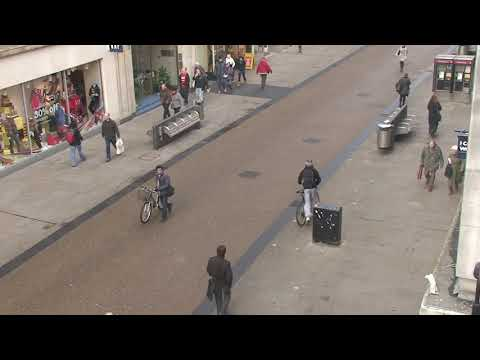

In [ ]:
# YouTube TownCentreXVID video
# https://www.youtube.com/watch?v=ZVmPaCZY3Mc
YOUTUBE_ID = 'ZVmPaCZY3Mc'


# YouTube Mall
# https://www.youtube.com/watch?v=WvhYuDvH17I
# YOUTUBE_ID = 'WvhYuDvH17I'

from IPython.display import YouTubeVideo
YouTubeVideo(YOUTUBE_ID)

## Saving the video file locally

The video will be downloaded and saved locally.

Also for convenience we will extract only a few seconds (optional step ofc).

In [ ]:
!pip install -q youtube-dl

max_seconds = 30
file_video_target = "video.mp4"
fname = file_video_target.split('.')[0]

!rm -rf $file_video_target &> /dev/null
# download the youtube with the given ID
!youtube-dl -f 'bestvideo[ext=mp4]' --output $fname".%(ext)s" https://www.youtube.com/watch?v=$YOUTUBE_ID
# cut the first X seconds
if max_seconds is not None:
  print(f'Extracting only {max_seconds} seconds')
  !ffmpeg -y -loglevel info -i $file_video_target -t $max_seconds $file_video_target &> /dev/null

print('File ready to use')

     |████████████████████████████████| 1.9MB 18.0MB/s 
[youtube] ZVmPaCZY3Mc: Downloading webpage
[youtube] ZVmPaCZY3Mc: Downloading MPD manifest
[dashsegments] Total fragments: 48
[download] Destination: video.mp4
[download] 100% of 77.35MiB in 00:19
Extracting only 30 seconds
File ready to use


# Utilities for OpenPose

Here we will implement some utility functions that will be used later  in the code.

In [ ]:
import numpy as np
import cv2

# Openpose visualization
# =================================================================

def draw_skeleton(frame, keypoints, colour=(255,0,0), dotted=False):
    connections = [(0, 16), (0, 15), (16, 18), (15, 17),
                   (0, 1), (1, 2), (2, 3), (3, 4),
                   (1, 5), (5, 6), (6, 7), (1, 8),
                   (8, 9), (9, 10), (10, 11),
                   (8, 12), (12, 13), (13, 14),
                   (11, 24), (11, 22), (22, 23),
                   (14, 21), (14, 19), (19, 20)]

    for x, y in keypoints:
        if 0 in (x, y):
            continue
        center = int(round(x)), int(round(y))
        cv2.circle(frame, center=center, radius=4, color=colour, thickness=-1)

    for keypoint_id1, keypoint_id2 in connections:
        x1, y1 = keypoints[keypoint_id1]
        x2, y2 = keypoints[keypoint_id2]
        if 0 in (x1, y1, x2, y2):
            continue
        pt1 = int(round(x1)), int(round(y1))
        pt2 = int(round(x2)), int(round(y2))
        cv2.line(frame, pt1=pt1, pt2=pt2, color=colour, thickness=2)
    return frame



def centroid(pts, exclude_zero=True):
    pts = np.asarray(pts)
    assert len(pts.shape) == 2 and pts.shape[1] == 2, 'Array must be [n,2]'

    def centroidnp(arr):
        length = arr.shape[0]
        sum_x = np.sum(arr[:, 0])
        sum_y = np.sum(arr[:, 1])
        res = np.asarray([sum_x / length, sum_y / length])
        return res

    if exclude_zero:
        # true if there is at least one non-zero element.
        # with axis=1 checking the 1 axis, so columns.
        # i.e. looking for rows that have column with at least one true (!= 0)
        # valid_pts = np.any(pts, axis=1)
        valid_pts = pts[np.any(pts, axis=1), :]

        if valid_pts.shape[0] > 0:
            return centroidnp(valid_pts)
        else:
            raise Exception('No valid point in pts. Set exclude_zero to False')
    else:
        return centroidnp(pts)


# Reading the video frame. How is it?

Reading the video, to extract a frame. 

For semplicity, we use the frame number 0. 

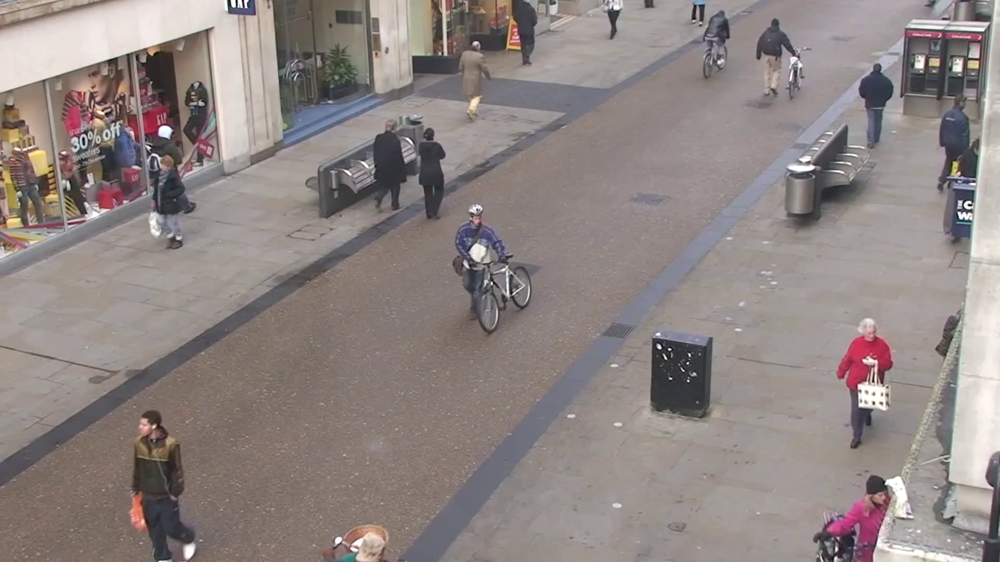

In [ ]:
from google.colab.patches import cv2_imshow

cap = cv2.VideoCapture("video.mp4")

frame_n = 0
counter = 0

while True:
  ret, frame = cap.read()
  if not ret or counter >= frame_n:
    break
  else:
    counter+=1
  
im_size = frame.shape
cv2_imshow(frame)


# OpenPose in action!

Ok now it's time for the ML part. First of all, we have to extract the people's positions inside a certain image using the OpenPose neural network.

We will use the python bindings provided with OpenPose, and in particular our previously defined wrapper.
Then we will check what the network output is, by displaying the bodies in the image.

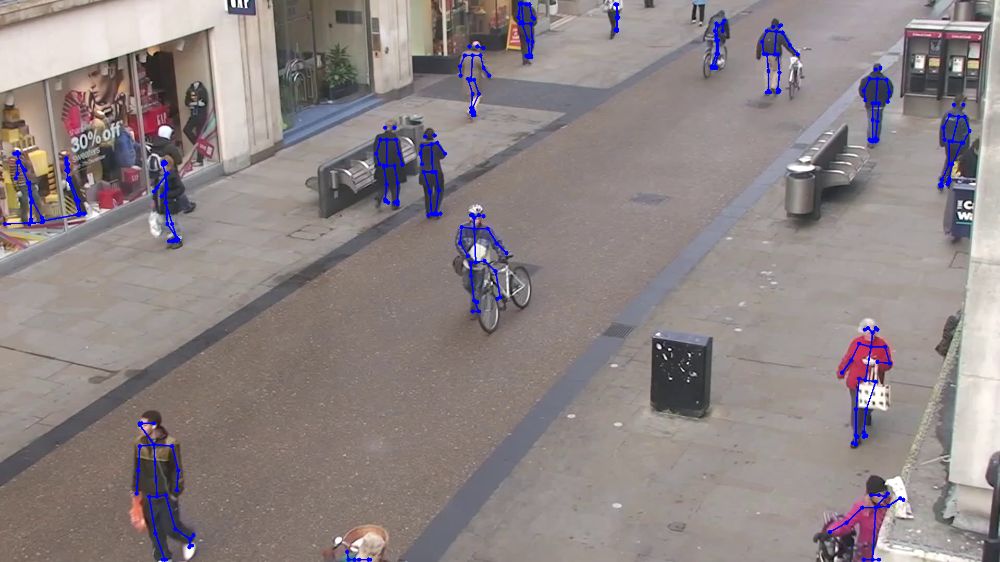

In [ ]:

## Using python API bindings WrapperPython from pyopenpose
# opWrapper = op.WrapperPython()
# params = dict()
# params["model_folder"] = "openpose/models/"

# opWrapper.configure(params)
# opWrapper.start()
# datum = op.Datum()

# datum.cvInputData = frame

# opWrapper.emplaceAndPop(op.VectorDatum([datum]))

## I am using a custom defined wrapper (over the already existing wrapper.. yeah, I know, let me be)
custom_wrapper = OpenPoseWrapper()
keypoints = custom_wrapper.get_keypoints(frame)  # KxJx3

skeletons = keypoints[:, :, 0:2]  # KxJ

cp_frame = frame.copy()
for skeleton in skeletons:
  # print(skeleton)
  draw_skeleton(cp_frame, skeleton)

cv2_imshow(cp_frame)

# And here comes the magic

Here we will use the homography ~~magic~~... matrix. 

Usually, you would use the function called ```cv2.findHomography()``` as part of the ```cv2``` module, which does some math operations between two sets of points, obtaining the matrix that we will use for the transformation into the planar projective space.

This is how to do it mathematically, but since some steps are required in order to get a good homography, we use a previous calculated (but not optimized) homography matrix on that video. This matrix has been obtained with a method that is part of an enterprise software.

As a result, we will see the perspective view.


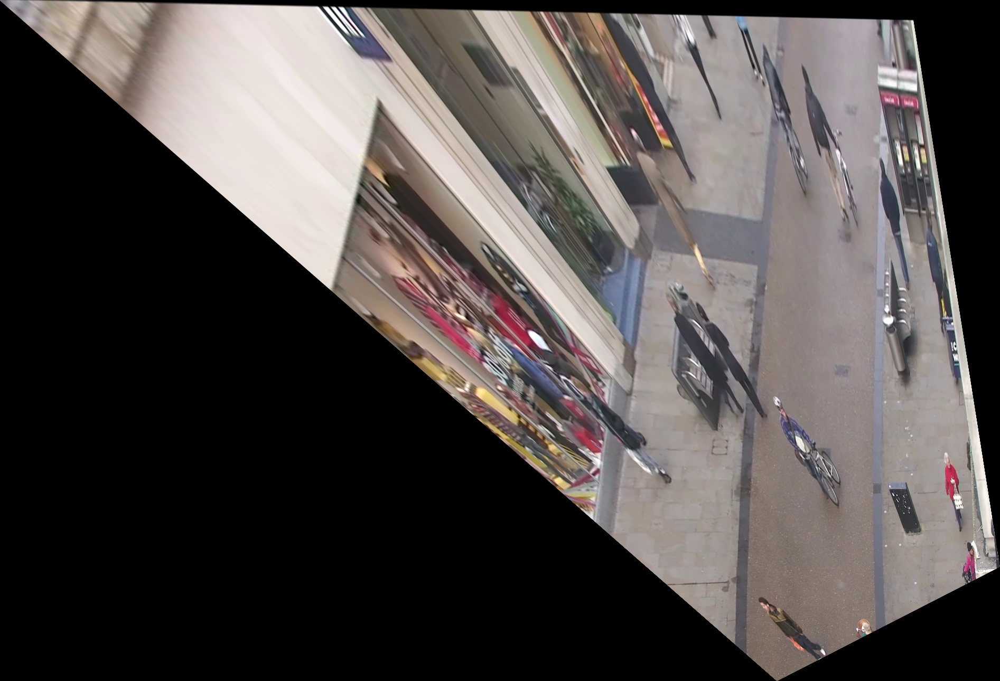

In [ ]:
# HOMOGRAPHY MAGIC

import json

# this is how to do it mathematically, but since some steps are required in 
# order to get a correct homography, we use a previous calculated (but not 
# optimized) homography matrix
def compute_homography(pts1, pts2):
  h, status = cv2.findHomography(pts1, pts2)
  return h

previous_config_str = '{"homography_matrix":[[1.6467088390692677,5.1418249047541575,-0.455209332524646],[0.03714008190854082,4.510218260097977,0.019514961022878197],[0.0004313776114372802,0.0025703686312520285,1]],"xmax":476,"xmin":-1417,"ymax":428,"ymin":-862}'
previous_config = json.loads(previous_config_str)

h0 = np.asarray(previous_config['homography_matrix'], dtype=np.float32)
xmax = previous_config['xmax']
xmin = previous_config['xmin']
ymax = previous_config['ymax']
ymin = previous_config['ymin']

image_rec = cv2.warpPerspective(frame.copy(), h0, (xmax - xmin, ymax - ymin))
cv2_imshow(image_rec)


## Compact representation

In this section, we will see how to use the actual ML output. 
First, we will adapt the ML output to our task. 

We will transform the body joint of a person to a more compact representation we can use in a single frame. One way to do this is to compute the centroid of the body joints.


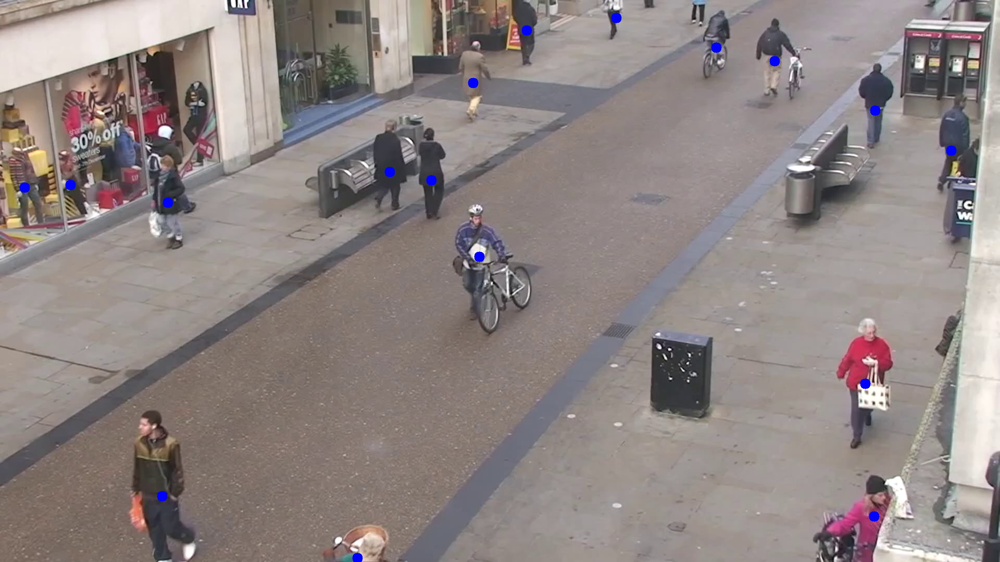

In [ ]:
blue = (255, 0, 0)
red = (0, 0, 255)

centroid_frame = frame.copy()

people = []
for skeleton in skeletons:
  person_point = list(map(int, centroid(skeleton)))  # compute the centroid of skeleton
  people.append(np.asarray(person_point))  # as a numpy array, for later use
  cv2.circle(centroid_frame, (person_point[0], person_point[1]), 10, blue, -1)

cv2_imshow(centroid_frame)


## Visualize the people in the perspective view

Now, using the homography matrix, we use project the centroid of each person into the perspective planar view.

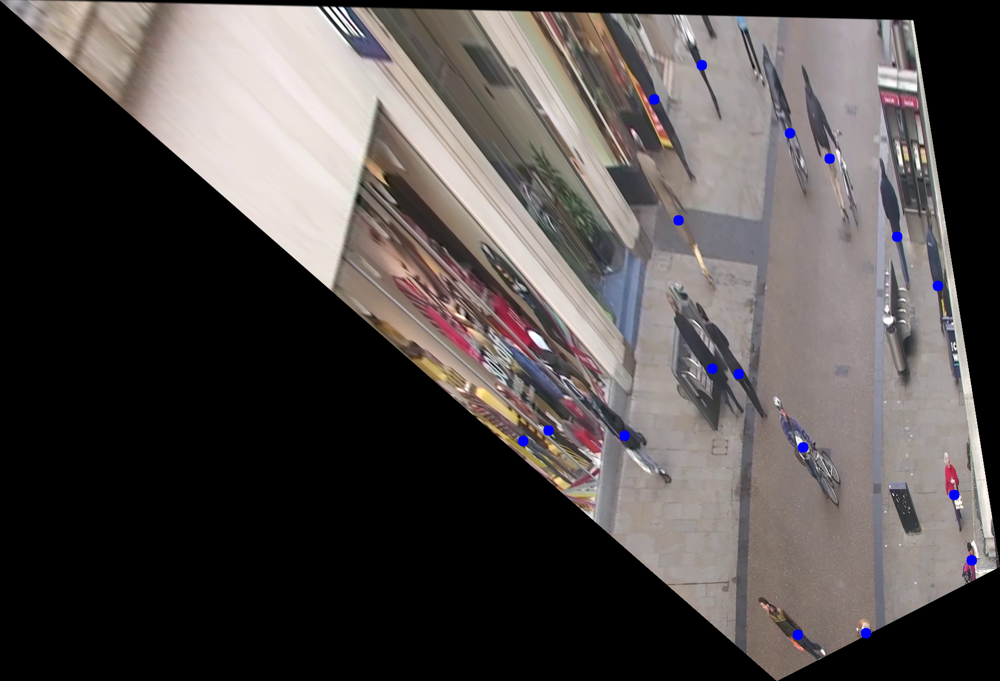

In [ ]:
perspective_people = []
for p in people:
  tmp = p.reshape((-1,1,2)).astype(np.float32)
  perspective_float = cv2.perspectiveTransform(tmp, h0)
  perspective_coords = perspective_float.reshape(1, -1)[0].astype(np.int)
  perspective_people.append(perspective_coords)

for p in perspective_people:
  cv2.circle(image_rec, (p[0], p[1]), 10, blue, -1)

cv2_imshow(image_rec)

Okay, nice!

We got the same blue points we had before, so what am I excited for?
Well now we have all points presumably on the same plane. This means, we know the distance between each person without the distortion in the original image.

# One last step

At this point we want to check who is the closest person detected in the perspective view for each person. 


## Compute the distances

Let's create a dictionary (key value pairs), in which we have all the people indexes as keyes, and the index of their closest person as values. We also add the distance from that person (we will use it later).

In [ ]:
def normL2(x, y):
  return np.linalg.norm(np.asarray(x) - np.asarray(y))

closests_idxs = {}

for i, p0 in enumerate(perspective_people):
  min_d = float('inf')
  candidate = None
  candidate_idx = None
  for j, p1 in enumerate(perspective_people):
    if np.all(p0 == p1):
      continue
    curr_d = normL2(p0, p1)
    if curr_d < min_d:
      candidate = p1
      candidate_idx = j
      min_d = curr_d

  if candidate is None:
    # handle this case
    continue
  else:
    closests_idxs[i] = (candidate_idx, min_d)
  

# Print the values:
# print(closests_idxs)
for idx in closests_idxs:
  data = closests_idxs[idx]
  c_idx = data[0]
  value = data[1]
  print(f"For person {idx} the closest person is {c_idx}\t(distance of {value:.2f})")

For person 0 the closest person is 9	(distance of 128.32)
For person 1 the closest person is 7	(distance of 50.99)
For person 2 the closest person is 15	(distance of 129.03)
For person 3 the closest person is 16	(distance of 89.04)
For person 4 the closest person is 8	(distance of 120.74)
For person 5 the closest person is 1	(distance of 184.95)
For person 6 the closest person is 11	(distance of 233.57)
For person 7 the closest person is 1	(distance of 50.99)
For person 8 the closest person is 4	(distance of 120.74)
For person 9 the closest person is 0	(distance of 128.32)
For person 10 the closest person is 14	(distance of 52.00)
For person 11 the closest person is 13	(distance of 111.02)
For person 12 the closest person is 14	(distance of 144.35)
For person 13 the closest person is 11	(distance of 111.02)
For person 14 the closest person is 10	(distance of 52.00)
For person 15 the closest person is 2	(distance of 129.03)
For person 16 the closest person is 3	(distance of 89.04)


## Draw in the perspective view

Let's draw a line from each person to their closest in the perspective view


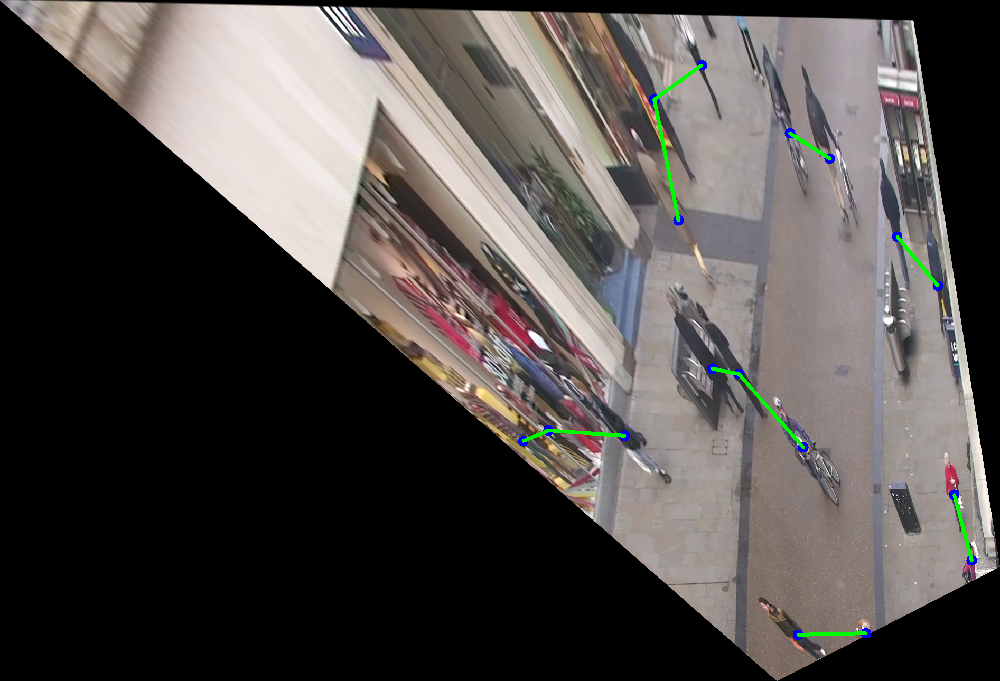

In [ ]:
perspective_final_frame = image_rec.copy()

green = (0, 250, 0)
orange = (0, 140, 255)

for k in closests_idxs.keys():
  closest_idx = closests_idxs[k][0]
  closest = perspective_people[closest_idx]
  pt1 = tuple(map(int, perspective_people[k]))
  pt2 = tuple(map(int, closest))
  cv2.line(perspective_final_frame, pt1, pt2, green, 5)

cv2_imshow(perspective_final_frame)



## Draw in the original frame

Let's draw this in the original (unprojected) frame

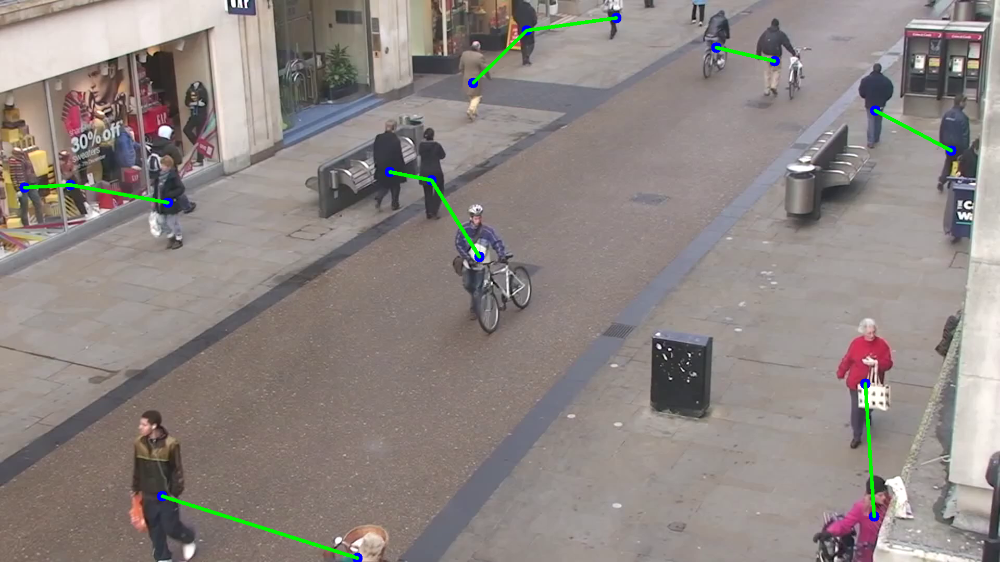

In [ ]:
final_frame = centroid_frame.copy()

for k in closests_idxs.keys():
  closest = closests_idxs[k][0]
  pt1 = tuple(map(int, people[k]))
  pt2 = tuple(map(int, people[closest]))
  cv2.line(final_frame, pt1, pt2, green, 5)

cv2_imshow(final_frame)

## Finally...

Ok, but this is not useful by itself. We need to know which of them are too close, how we do it? 

Well, sounds like it's time for the step all data scientists most hate, but it is (sometimes) inevitable: thresholding!

I want to highlight the people only when they come closer than 100 units.

The unit can be meters, decimeters, centimeters, pixels, etc... depending on method used in the h0 (homography) calibration.


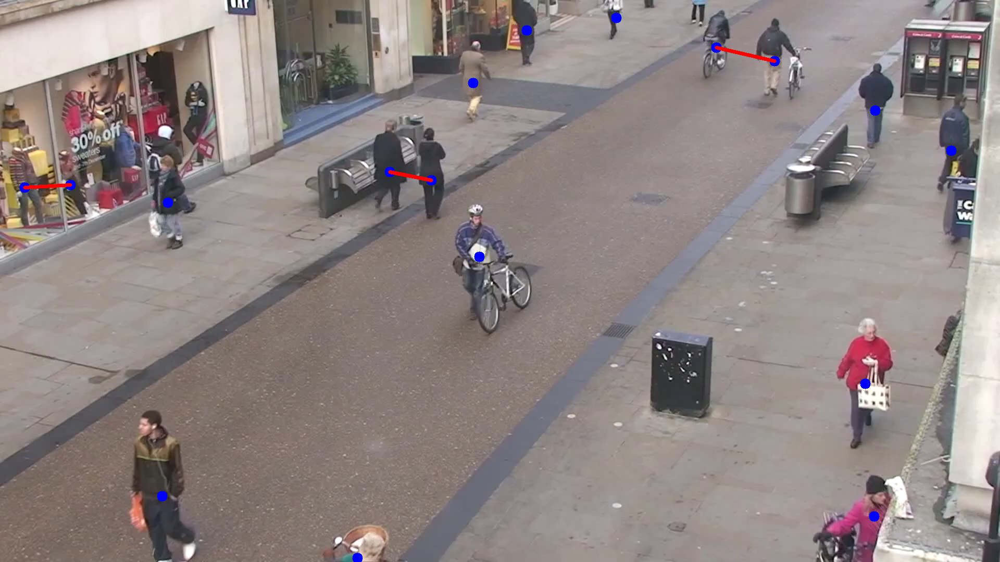

In [ ]:
real_final_frame = centroid_frame.copy()

th = 100  # arbitrary, yes, but also customizable ;)

for k in closests_idxs.keys():
  data = closests_idxs[k]
  closest = data[0]
  value = data[1]
  if value >= th:
    continue

  pt1 = tuple(map(int, people[k]))
  pt2 = tuple(map(int, people[closest]))
  cv2.line(real_final_frame, pt1, pt2, red, 5)

cv2_imshow(real_final_frame)

# And that's it